# Object Detection Demo: City Network of Capture Points
Welcome to the object detection inference walkthrough!  This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image. Make sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/object_detection/g3doc/installation.md) before you start.

<img src="img/activity_detector.jpg"></img>

<img src="img/dogneuralnetwork.png"></img>

# Imports

In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import getpass

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

from PIL import ImageGrab
import time
import pandas as pd

import cv2

import requests
from io import BytesIO

from copy import deepcopy

import scipy.misc

from datetime import datetime

## Env setup

In [2]:
# This is needed to display the images.
%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

# Establish Connection to ArcGIS Online via ArcGIS API for Python

#### Authenticate

In [3]:
import arcgis

In [4]:
portals_dict = {
    "esrifederal_gis": r"https://esrifederal.maps.arcgis.com",
    "natgov_gis": r"http://esri-natgov105.eastus.cloudapp.azure.com/arcgis",
    "dot_gis": r"http://dot.esri.com/portal",
    "dev_gis": r"http://govdev.eastus.cloudapp.azure.com/arcgis",
    "local_gis": r"https://anieto.esri.com/arcgis",
    "brett_gis": r"https://agsbase.dcwebgis.net/portal",
    "bill_gis": r"https://idt.esri.com/portal"
}

gis_url = portals_dict["esrifederal_gis"]

if gis_url == portals_dict["esrifederal_gis"]:
    gis_app_id = r"wt3QUR1M4eum0TVI"
    print("Attempting to log in to '{0}'...".format(gis_url))
    gis = arcgis.gis.GIS(gis_url, client_id=gis_app_id)
    print("Successfully logged in as: " + gis.properties.user.username)
else:
    gis_username = getpass.getpass(prompt="Username: ")
    gis_pw = getpass.getpass(prompt="Password: ")
    print("Attempting to log in to '{0}'...".format(gis_url))
    gis = arcgis.gis.GIS(gis_url, gis_username, gis_pw, verify_cert=False)
    print("Successfully logged in as: " + gis.properties.user.username)

Attempting to log in to 'https://esrifederal.maps.arcgis.com'...
Please sign in to your GIS and paste the code that is obtained below.
If a web browser does not automatically open, please navigate to the URL below yourself instead.
Opening web browser to navigate to: https://esrifederal.maps.arcgis.com/sharing/rest/oauth2/authorize?client_id=wt3QUR1M4eum0TVI&response_type=code&expiration=-1&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob
Enter code obtained on signing in using SAML: ········
Successfully logged in as: albe9057@esri.com_esrifederal


## Object detection imports
Here are the imports from the object detection module.

In [5]:
from utils import label_map_util

from utils import visualization_utils as vis_util

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing `PATH_TO_CKPT` to point to a new .pb file.  

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

### Model: SSD Mobilenet on COCO

In [6]:
# What model to download.
MODEL_NAME = 'ssd_mobilenet_v1_coco_11_06_2017'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

NUM_CLASSES = 90

### Model: SSD Inception on COCO

In [7]:
# What model to download.
MODEL_NAME = 'ssd_inception_v2_coco_2017_11_17'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

NUM_CLASSES = 90

### Model: Faster RCNN ResNet101 on Kitti 

In [28]:
# What model to download.
MODEL_NAME = 'faster_rcnn_resnet101_kitti_2018_01_28'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'pascal_label_map.pbtxt')

NUM_CLASSES = 20

## Download Model

In [7]:
# opener = urllib.request.URLopener()
# opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
# tar_file = tarfile.open(MODEL_FILE)
# for file in tar_file.getmembers():
#     file_name = os.path.basename(file.name)
#     if 'frozen_inference_graph.pb' in file_name:
#         tar_file.extract(file, os.getcwd())

## Load a (frozen) Tensorflow model into memory.

In [8]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [9]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [10]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

## Helper code

In [11]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

This is a helper function that takes the detection graph output tensor (np arrays), stacks the classes and scores, and determines if the class for a person (1) is available within a certain score and within a certain amount of objects

In [12]:
def object_counter(classes_arr, scores_arr, score_thresh=0.5):
    # Process the numpy array of classes from the model
    stacked_arr = np.stack((classes_arr, scores_arr), axis=-1)
    # Convert to pandas dataframe for easier querying
    detection_df = pd.DataFrame(stacked_arr)
    # Retrieve total count of cars with score threshold above param value
    detected_cars = detection_df[(detection_df[0] == 3.0) & (detection_df[1] > score_thresh)]
    detected_people =  detection_df[(detection_df[0] == 1.0) & (detection_df[1] > score_thresh)]
    detected_bicycles =  detection_df[(detection_df[0] == 2.0) & (detection_df[1] > score_thresh)]
    detected_motorcycles =  detection_df[(detection_df[0] == 4.0) & (detection_df[1] > score_thresh)]
    detected_buses =  detection_df[(detection_df[0] == 6.0) & (detection_df[1] > score_thresh)]
    detected_trucks =  detection_df[(detection_df[0] == 8.0) & (detection_df[1] > score_thresh)]
    
    car_count = len(detected_cars)
    people_count = len(detected_people)
    bicycle_count = len(detected_bicycles)
    motorcycle_count = len(detected_motorcycles)
    bus_count = len(detected_buses)
    truck_count = len(detected_trucks)

    return car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count

# Network Camera Processing

In [45]:
# TrafficLand API source JSON
source_json = r"http://api.trafficland.com/v1.5/json/video_feeds?system=ddot&key=1594c8892d7fbd18181a8a6a44958b28"

In [46]:
df = pd.read_json(source_json)
df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt
0,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1434662178697,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 e/o Sudley Rd,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,20,"{'isDisabled': False, 'hasQualityWarning': False}",1485736691577
1,{'halfJpeg': 'http://ie.trafficland.com/v1.0/3...,1435687260210,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Virginia Visitor Center,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,30,"{'isDisabled': False, 'hasQualityWarning': False}",1453828214719
2,{'halfJpeg': 'http://ie.trafficland.com/v1.0/4...,1434737139006,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 East of 234 Business,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,40,"{'isDisabled': False, 'hasQualityWarning': False}",1453479512331
3,{'halfJpeg': 'http://ie.trafficland.com/v1.0/5...,1435631718151,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 e/o Compton Rd,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,50,"{'isDisabled': False, 'hasQualityWarning': False}",1451137927983
4,{'halfJpeg': 'http://ie.trafficland.com/v1.0/6...,1435620924132,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Rt-29,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,60,"{'isDisabled': False, 'hasQualityWarning': False}",1453806855092
5,{'halfJpeg': 'http://ie.trafficland.com/v1.0/7...,1435620956761,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Rt-28,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,70,"{'isDisabled': False, 'hasQualityWarning': False}",1453481361428
6,{'halfJpeg': 'http://ie.trafficland.com/v1.0/8...,1435620986719,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Rt-28 s/o I-66,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,80,"{'isDisabled': False, 'hasQualityWarning': False}",1453483858111
7,{'halfJpeg': 'http://ie.trafficland.com/v1.0/9...,1435621013188,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ North Stringfellow Rd,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,90,"{'isDisabled': False, 'hasQualityWarning': False}",1452337606698
8,{'halfJpeg': 'http://ie.trafficland.com/v1.0/1...,1435687243031,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Fairfax County Parkway,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,100,"{'isDisabled': False, 'hasQualityWarning': True}",1453483857517
9,{'halfJpeg': 'http://ie.trafficland.com/v1.0/1...,1435621051831,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Fairfax Co Pkwy,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,110,"{'isDisabled': False, 'hasQualityWarning': False}",1453485406907


In [47]:
df.shape

(714, 12)

In [48]:
ddot_df = df.loc[df.provider == 'DDOT']
ddot_df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt
373,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420732661508,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",K St @ 17th St & Conneticut Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200001,"{'isDisabled': False, 'hasQualityWarning': False}",1473442821241
374,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381553029,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",New Hampshire Ave @ Georgia Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200002,"{'isDisabled': False, 'hasQualityWarning': False}",1473442837977
375,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381584896,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",M St @ Francis Scott Key Brdg,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200003,"{'isDisabled': False, 'hasQualityWarning': False}",1473442847933
376,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420749104062,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",M St @ S Capitol St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200004,"{'isDisabled': False, 'hasQualityWarning': False}",1473442869524
377,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381400497,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Florida Ave @ New York Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200005,"{'isDisabled': False, 'hasQualityWarning': False}",1473442883854
378,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1447105847684,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Eastern Ave @ Kenilworth Ave,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200006,"{'isDisabled': False, 'hasQualityWarning': False}",1473442897132
379,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381665549,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",4th St @ New York Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200007,"{'isDisabled': False, 'hasQualityWarning': False}",1473442909339
380,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381743127,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",14th St Brdg,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200009,"{'isDisabled': False, 'hasQualityWarning': False}",1473442924345
381,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381770318,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Ist St @ Delaware Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200011,"{'isDisabled': False, 'hasQualityWarning': False}",1473442938691
382,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381794915,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Georgia Ave @ Irving St,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200012,"{'isDisabled': False, 'hasQualityWarning': False}",1473442951559


In [49]:
ddot_df.iloc[1]['location']

{'cityCode': 'WAS',
 'cityName': 'Washington',
 'countryCode': 'US',
 'countryName': 'United States',
 'latitude': 38.936701,
 'longitude': -77.024232,
 'stateCode': 'DC',
 'stateName': 'District of Columbia',
 'zipCode': '20507'}

In [50]:
test_url = ddot_df.iloc[1]['content']['hugeJpeg']
test_url

'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=fae59d0b26e87f1f3e82ff2bade37b56a819670285c101c539b73812e2638a4c&refreshRate=2000'

In [51]:
def return_lat(row):
    return row['location']['latitude']

def return_lon(row):
    return row['location']['longitude']

In [52]:
# Edit the ddot_df to make a feature service using the API
ddot_df['latitude'] = ddot_df.apply(lambda row: return_lat(row), axis=1)
ddot_df['longitude'] = ddot_df.apply(lambda row: return_lon(row), axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [53]:
workspace = r"C:\Users\albe9057\Documents\ANieto_SolutionEngineering\Projects\FedGIS\FedGIS_2018\Plenary_MachineLearning\Inputs"
ddot_df.to_csv(workspace+"\ddot_cameras.csv")
ddot_csv = workspace+"\ddot_cameras.csv"

In [54]:
ddot_csv

'C:\\Users\\albe9057\\Documents\\ANieto_SolutionEngineering\\Projects\\FedGIS\\FedGIS_2018\\Plenary_MachineLearning\\Inputs\\ddot_cameras.csv'

In [55]:
# Establish Network Dictionary
network_dictionary = {
    "camera_01": {
        "camera_url": ddot_df.iloc[0]['content']['hugeJpeg'],
        "feature_id": r"01",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_02": {
        "camera_url": ddot_df.iloc[1]['content']['hugeJpeg'],
        "feature_id": r"02",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_03": {
        "camera_url": ddot_df.iloc[18]['content']['hugeJpeg'],
        "feature_id": r"03",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_04": {
        "camera_url": ddot_df.iloc[3]['content']['hugeJpeg'],
        "feature_id": r"04",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_05": {
        "camera_url": ddot_df.iloc[4]['content']['hugeJpeg'],
        "feature_id": r"05",
        "location_lat": r"",
        "location_lon": r""
    },    
}

# Single Camera Prototyping

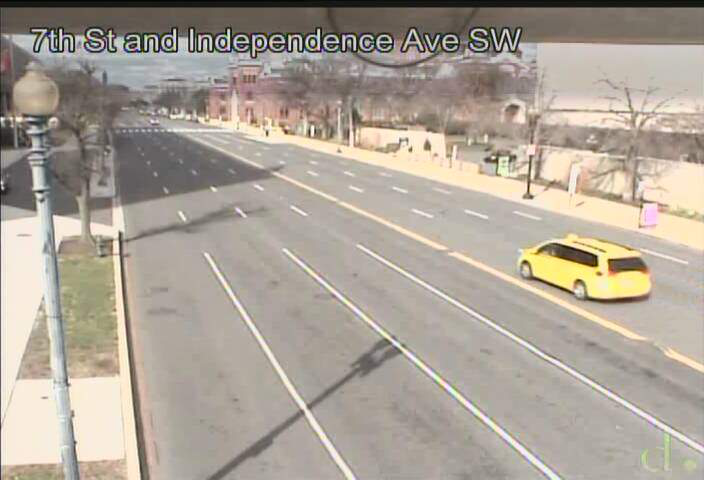

In [56]:
test_url = network_dictionary["camera_03"]["camera_url"]
response = requests.get(test_url)
img = Image.open(BytesIO(response.content))
img

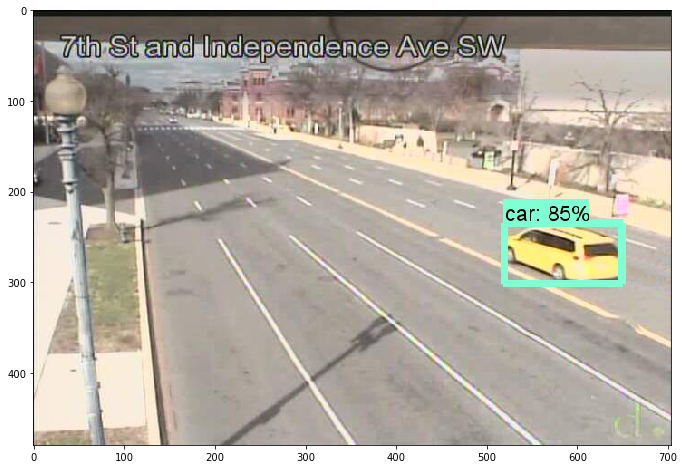

In [57]:
# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        image_np = load_image_into_numpy_array(img)
        image_np_expanded = np.expand_dims(image_np, axis=0)
        (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})
        vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              np.squeeze(boxes),
              np.squeeze(classes).astype(np.int32),
              np.squeeze(scores),
              category_index,
              use_normalized_coordinates=True,
              line_thickness=8)
        plt.figure(figsize=IMAGE_SIZE)
        plt.imshow(image_np)        

# Multiple Camera Iteration Prototyping

In [180]:
# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)
jpeg_size = "halfJpeg" # Other Options: halfJpeg; fullJpeg; hugeJpeg

## Option 0: Build Dict of downloaded jpeg arrays, then pass to model in subsequent cell -> Failed Option

In [287]:
%%time
# Set up a list of numpy arrays that contain each camera's image
camera_img_nparrays_dict = {}

# Iterate on each item in the source_json 
for ix in range(5):
    camera_url = ddot_df.iloc[ix]['content'][jpeg_size]
    camera_lat = ddot_df.iloc[ix]['location']['latitude']
    camera_lat = ddot_df.iloc[ix]['location']['longitude']
    camera_name = ddot_df.iloc[ix]['name']
    camera_id = ddot_df.iloc[ix]['publicId']
    
    camera_response = requests.get(camera_url)
    camera_img = Image.open(BytesIO(camera_response.content))
    camera_img_nparr = load_image_into_numpy_array(camera_img)
    camera_img_nparrext = np.expand_dims(camera_img_nparr, axis=0)  
    
    camera_img_nparrays_dict[camera_id] = {
        "camera_img_nparr": camera_img_nparr,
        "camera_img_nparrext": camera_img_nparrext,
        "camera_lat": camera_lat,
        "camera_lon": camera_lon,
        "camera_name": camera_name
    }

Wall time: 973 ms


In [337]:
m1 = gis.map('Ballston, VA', zoomlevel=11)
m1.basemap = 'streets-night-vector'
m1


Camera: K St @ 17th St & Conneticut Ave
Car Count: 0

Camera: New Hampshire Ave @ Georgia Ave 
Car Count: 0

Camera: M St @ Francis Scott Key Brdg
Car Count: 0

Camera: M St @ S Capitol St
Car Count: 1

Camera: Florida Ave @ New York Ave
Car Count: 1


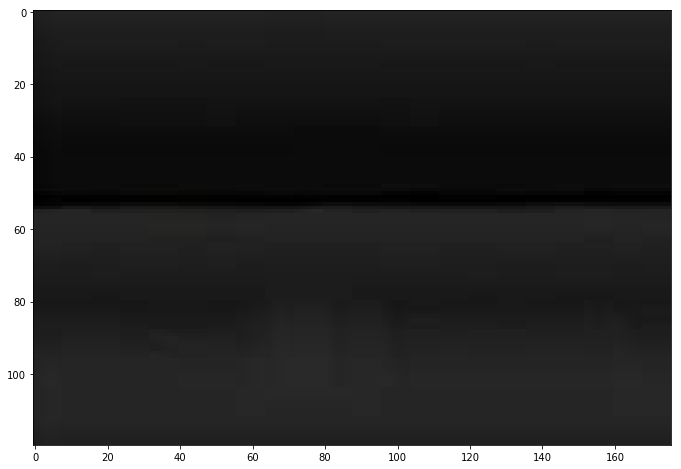

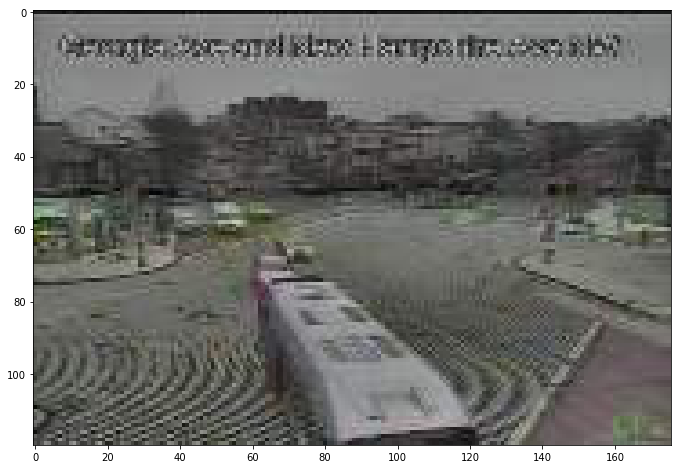

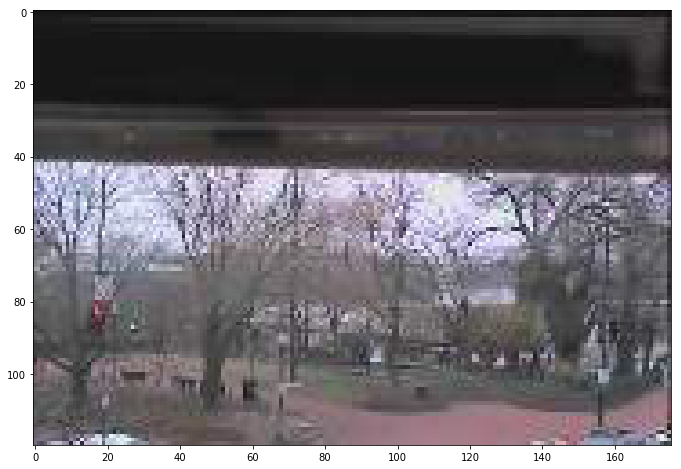

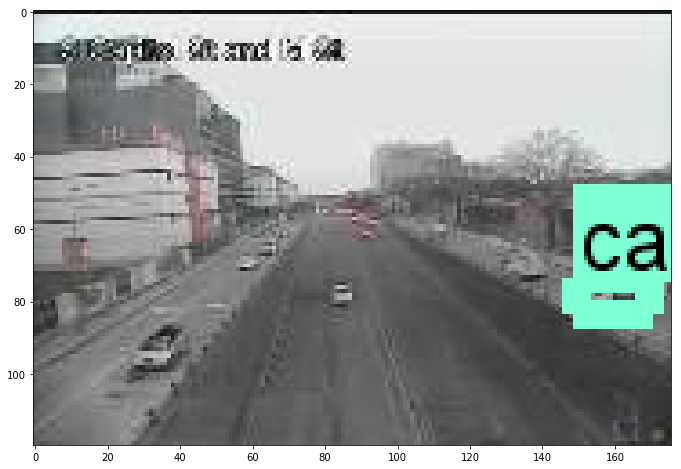

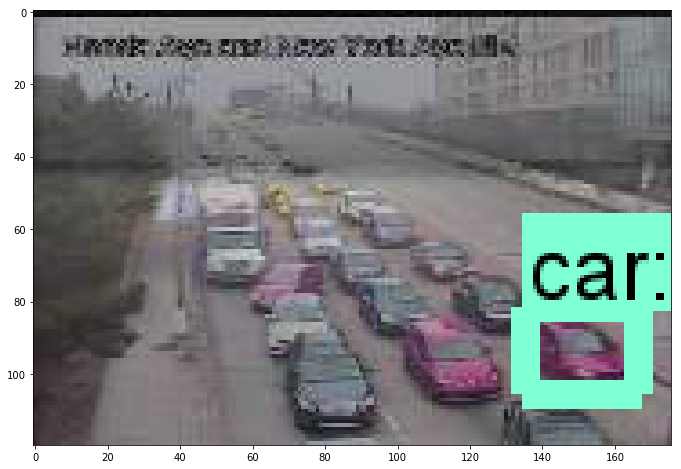

In [290]:
# %%time
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for camera_id in camera_img_nparrays_dict:

            # Retrieve camera information
            camera_lat = camera_img_nparrays_dict[camera_id]['camera_lat']
            camera_lon = camera_img_nparrays_dict[camera_id]['camera_lon']
            camera_name = camera_img_nparrays_dict[camera_id]['camera_name']
            image_np = camera_img_nparrays_dict[camera_id]['camera_img_nparr']
            image_np_expanded = camera_img_nparrays_dict[camera_id]['camera_img_nparrext']

            (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})

            vis_util.visualize_boxes_and_labels_on_image_array(
                  image_np,
                  np.squeeze(boxes),
                  np.squeeze(classes).astype(np.int32),
                  np.squeeze(scores),
                  category_index,
                  use_normalized_coordinates=True,
                  line_thickness=8)

            car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
            vehicle_count = car_count + motorcycle_count + bus_count + truck_count
            total_count = vehicle_count + bicycle_count + people_count                

            print()
            print("Camera: {0}".format(camera_name))
            print("Car Count: {0}".format(car_count))

            symbol = {"color": [255,255,0,255], "size": car_count*2, "type": "esriSMS", "style": "esriSMSCircle"}

            jpeg_content = "<img src='{}' width='200px'/>".format(camera_jpeg_url)
#                 jpeg_content = "<img src='{}' width='200px'/>".format(plt.imshow(image_np))

            m2.draw({'x':camera_lon, 'y':camera_lat}, 
                   symbol=symbol, 
                   popup={'Name':camera_name, 'content': jpeg_content, 'cars': car_count})

            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)        

## Option 1: Graphic Drawing from Model

In [181]:
m2 = gis.map('Ballston, VA', zoomlevel=11)
m2.basemap = 'streets-night-vector'
m2


Camera: New Hampshire Ave @ Georgia Ave 
Car Count: 2

Camera: M St @ Francis Scott Key Brdg
Car Count: 9

Camera: M St @ S Capitol St
Car Count: 0

Camera: Florida Ave @ New York Ave
Car Count: 1

Camera: Eastern Ave @ Kenilworth Ave
Car Count: 0

Camera: 4th St @ New York Ave
Car Count: 0

Camera: 14th St Brdg
Car Count: 1

Camera: Ist St @ Delaware Ave
Car Count: 2

Camera: Georgia Ave @ Irving St
Car Count: 2

Camera: 16th St @ U St
Car Count: 0

Camera: 16th St @ Columbia Rd
Car Count: 0

Camera: Georgia Ave @ Eastern Ave
Car Count: 3

Camera: 16th St @ Irving St
Car Count: 3

Camera: Georgia Ave @ Kansas Ave
Car Count: 0

Camera: S Capitol St @ Suitland Pkwy
Car Count: 0

Camera: Pennsylvania Ave @ SE Fwy
Car Count: 0

Camera: New York Ave @ Bladensburg Rd
Car Count: 2

Camera: Independence Ave @ 7th St
Car Count: 1

Camera: Connecticut Ave @ Calvert St
Car Count: 2

Camera: Maryland Ave @ H St & Benning Rd
Car Count: 7

Camera: Rhode Island Ave @ S Dakota Ave
Car Count: 3


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



Camera: E Capitol St @ Benning Rd
Car Count: 0

Camera: Benning Rd @ Minnesota Ave
Car Count: 1

Camera: Pennsylvania Ave @ 7th St
Car Count: 0


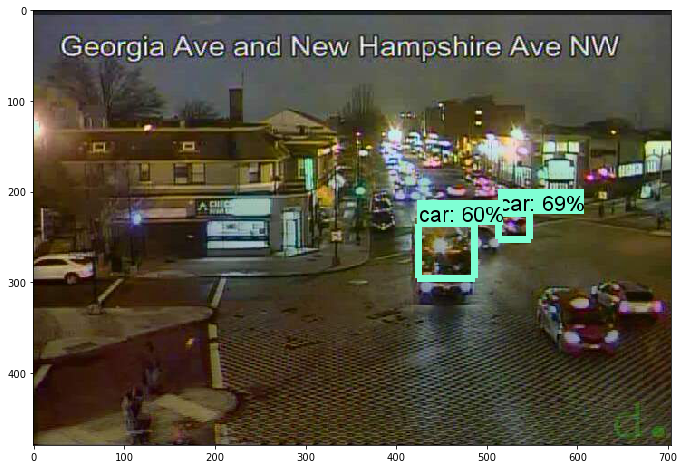

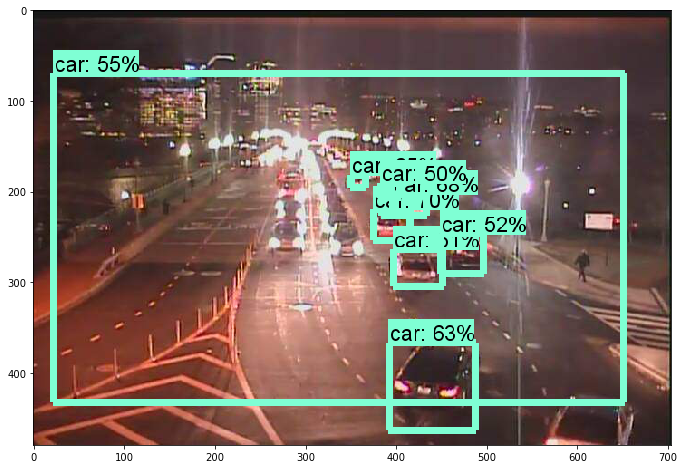

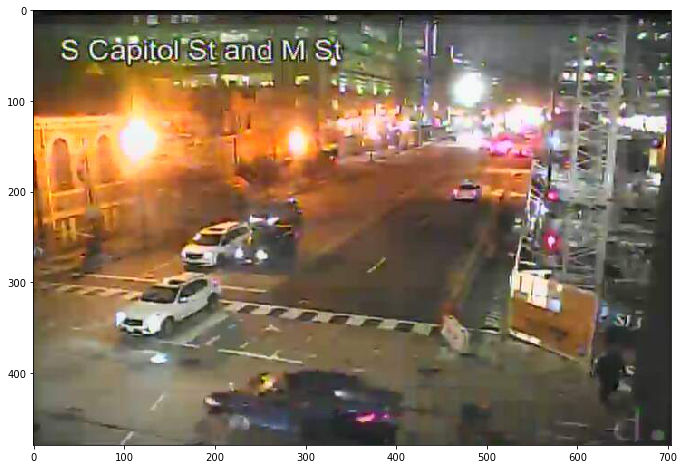

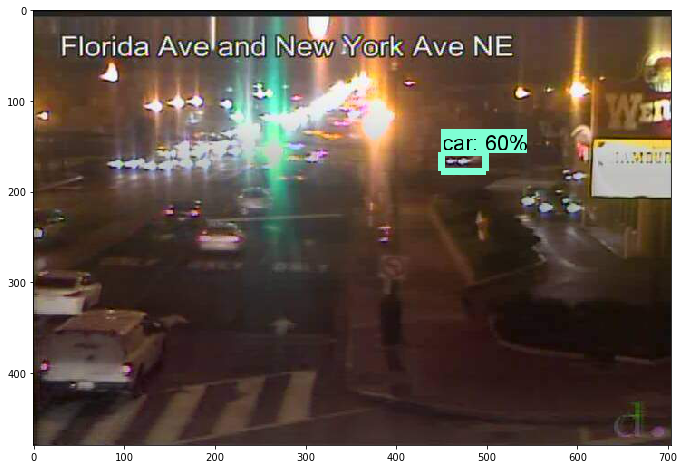

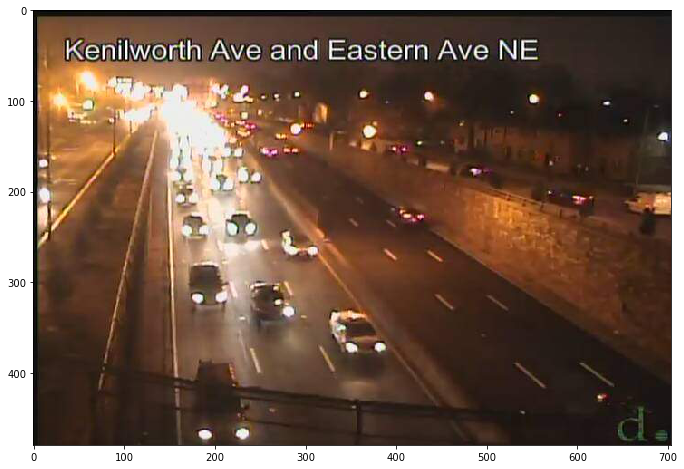

...

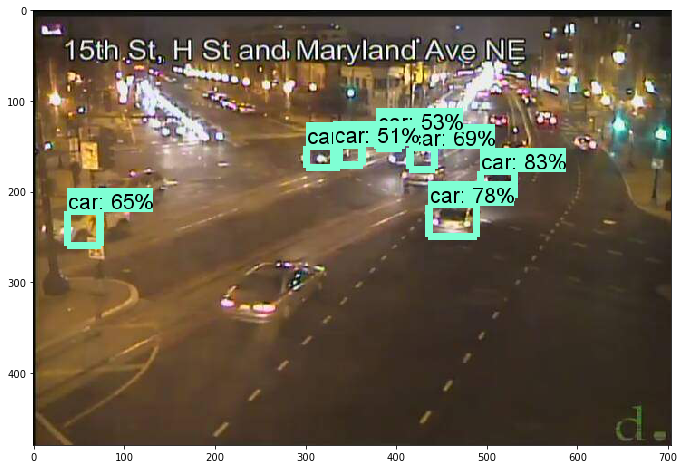

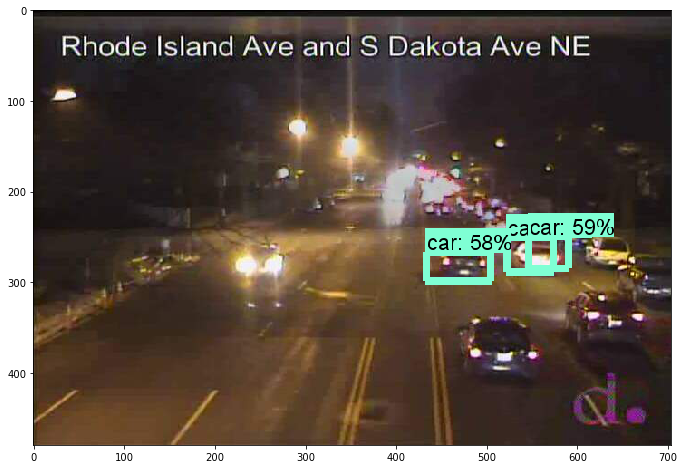

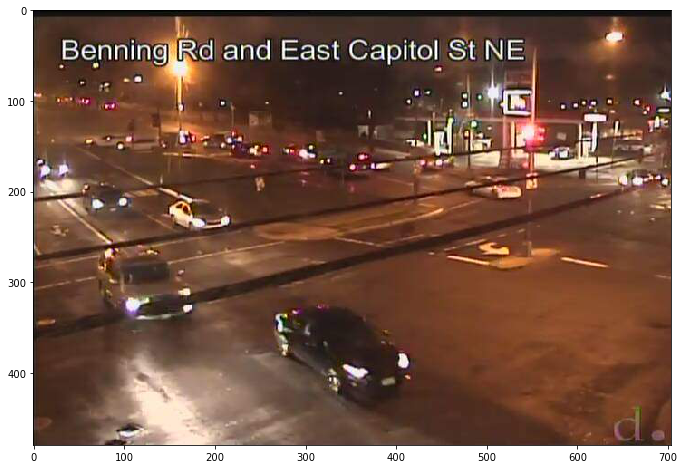

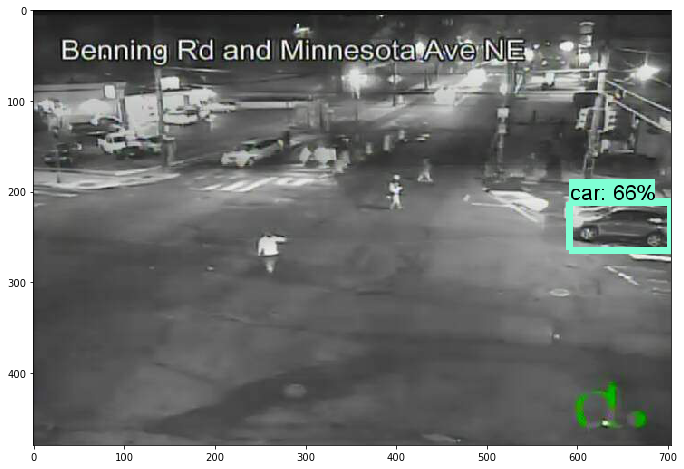

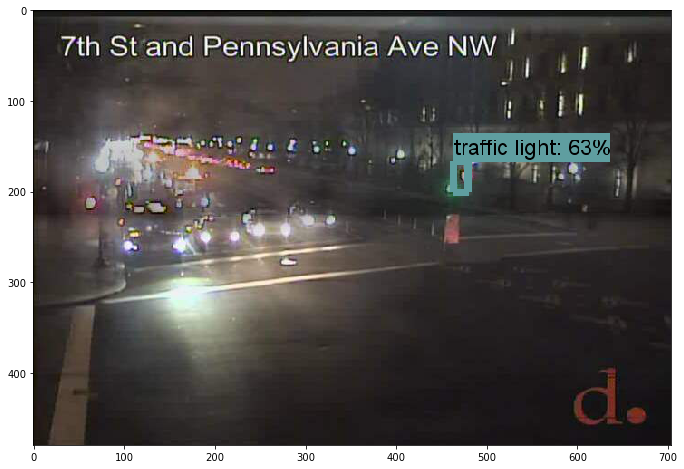

In [182]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(1):
            
            time.sleep(2)
            m2.clear_graphics()
            
            for ix in range(1,25):

                # Retrieve camera information
                camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_df.iloc[ix]['location']['longitude']
                camera_name = ddot_df.iloc[ix]['name']
                camera_id = ddot_df.iloc[ix]['publicId']
                

                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count                
                
                print()
                print("Camera: {0}".format(camera_name))
                print("Car Count: {0}".format(car_count))
                
                symbol = {"color": [255,255,0,255], "size": car_count*2, "type": "esriSMS", "style": "esriSMSCircle"}
                
                jpeg_content = "<img src='{}' width='200px'/>".format(camera_jpeg_url)
#                 jpeg_content = "<img src='{}' width='200px'/>".format(plt.imshow(image_np))
                
                m2.draw({'x':camera_lon, 'y':camera_lat}, 
                       symbol=symbol, 
                       popup={'title':camera_name, 'content': jpeg_content, 'cars': car_count})

                plt.figure(figsize=IMAGE_SIZE)
                plt.imshow(image_np)        

Test without feature drawing

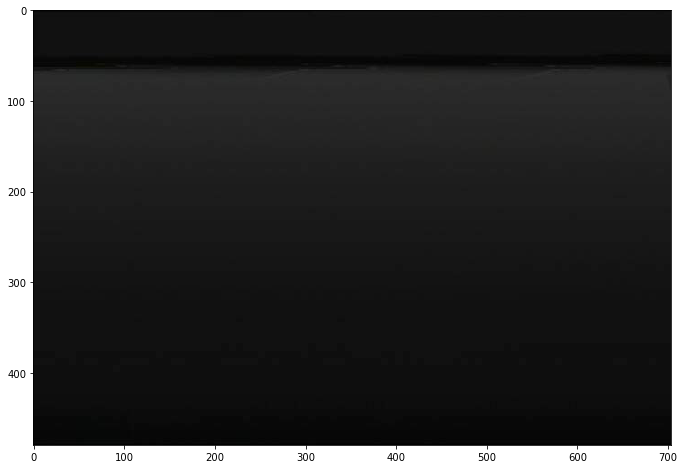

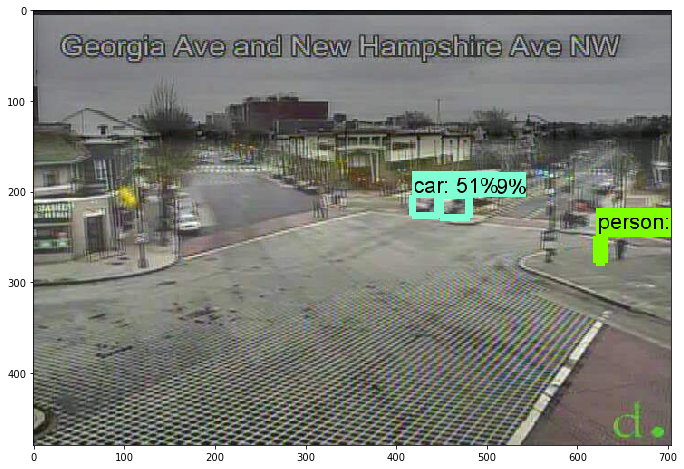

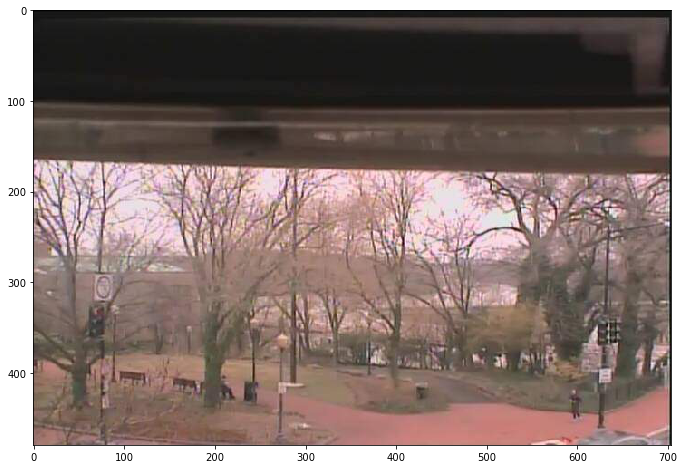

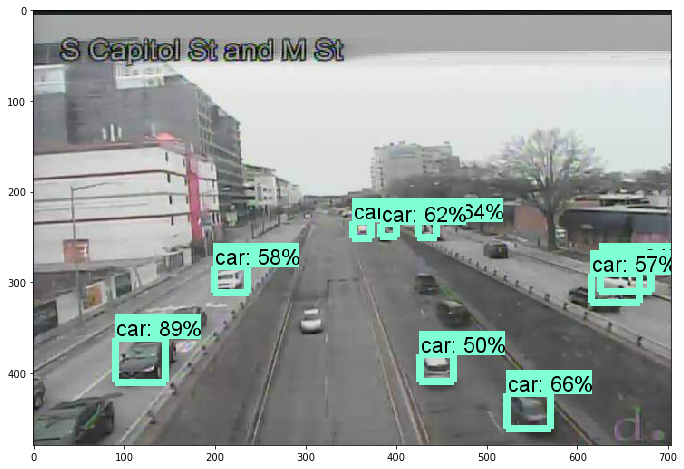

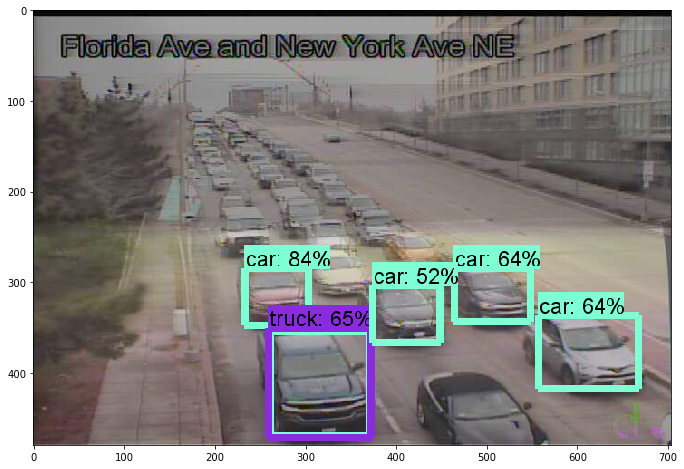

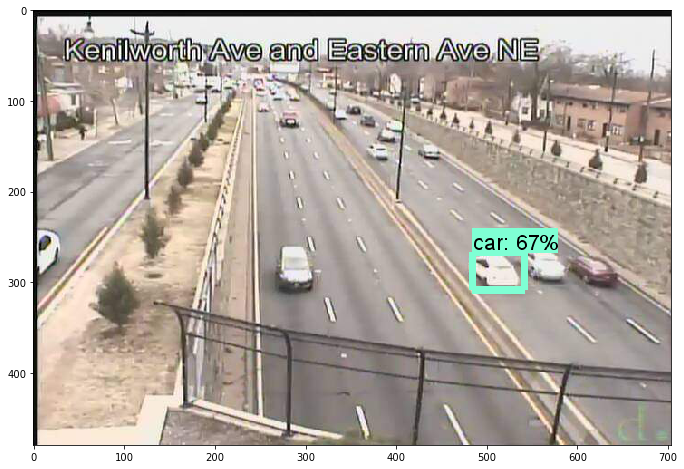

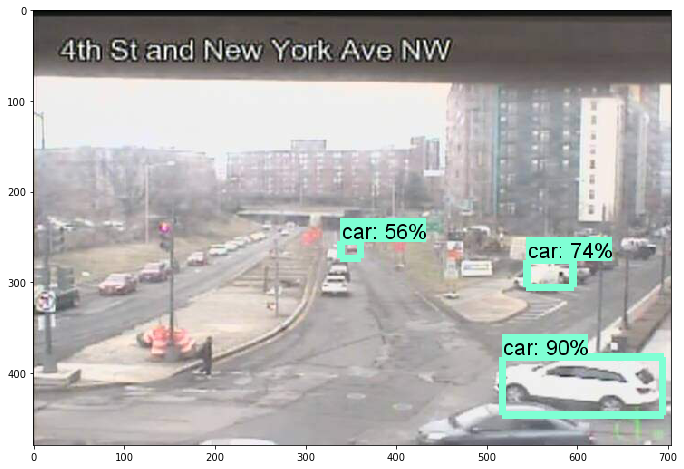

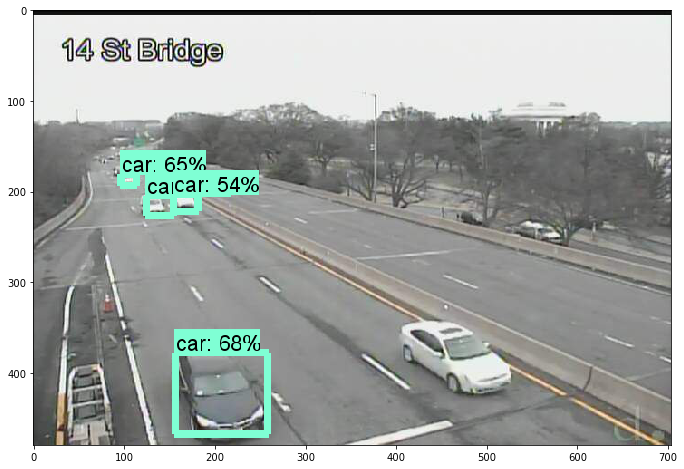

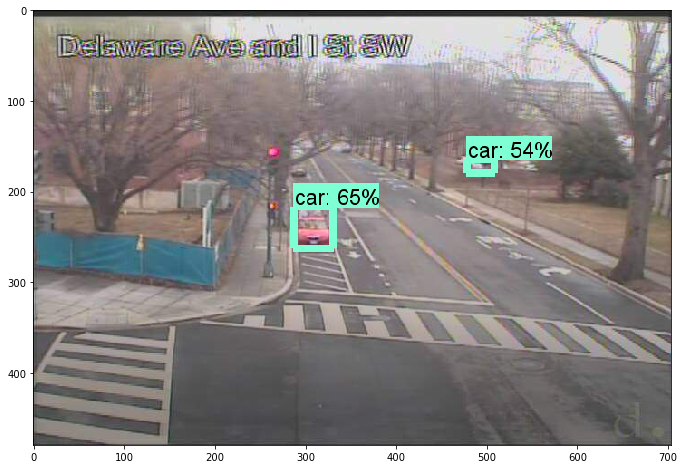

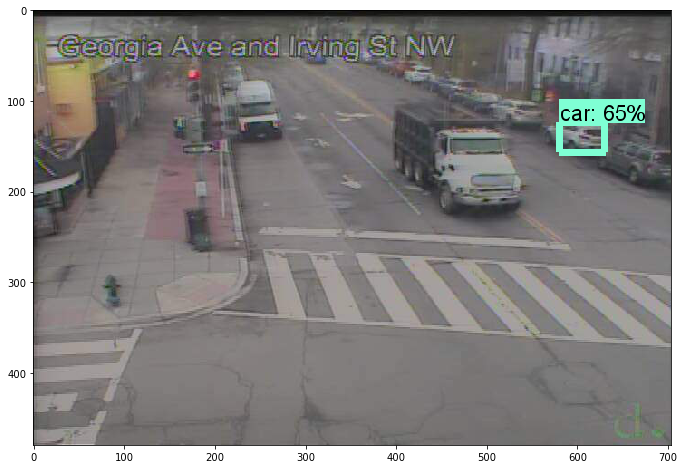

In [134]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for ix in range(10):

            # Retrieve camera information
            camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
            camera_lat = ddot_df.iloc[ix]['location']['latitude']
            camera_lon = ddot_df.iloc[ix]['location']['longitude']
            camera_name = ddot_df.iloc[ix]['name']
            camera_id = ddot_df.iloc[ix]['publicid']
            
            # Retrieve the camera image
            camera_response = requests.get(camera_jpeg_url)
            
            image = Image.open(BytesIO(camera_response.content))
            image_np = load_image_into_numpy_array(image)
            image_np_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                  image_np,
                  np.squeeze(boxes),
                  np.squeeze(classes).astype(np.int32),
                  np.squeeze(scores),
                  category_index,
                  use_normalized_coordinates=True,
                  line_thickness=8)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)        

## Option 2: Use existing feature service and send model outputs as updates

In [58]:
gis

<Item title:"DDOT Traffic Cameras" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
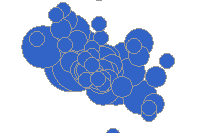

In [59]:
object_point_srvc = gis.content.search("DDOT Traffic Cameras", item_type="feature service")[0]
object_point_srvc

In [60]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,F__OBJECTID,activity_timestamp,attribute_0,content,createdAt,description,latitude,longitude,name,orientation,...,rt_bus_count,rt_car_count,rt_motorcycle_count,rt_object_count,rt_pedestrian_count,rt_truck_count,rt_vehicle_count,status,updatedAt,SHAPE
0,1,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420732661508,None,38.902599,-77.039233,K St @ 17th St & Conneticut Ave,WEST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': True}",1473442821241,"{'x': -8575968, 'y': 4707729}"
1,2,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381553029,None,38.936701,-77.024232,New Hampshire Ave @ Georgia Ave,SOUTH,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473442837977,"{'x': -8574298, 'y': 4712609}"
2,3,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381584896,None,38.905143,-77.068561,M St @ Francis Scott Key Brdg,WEST,...,1,2,0,3,0,0,3,"{'isDisabled': False, 'hasQualityWarning': False}",1473442847933,"{'x': -8579233, 'y': 4708093}"
3,4,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420749104062,None,38.876366,-77.009061,M St @ S Capitol St,EAST,...,0,1,0,1,0,0,1,"{'isDisabled': False, 'hasQualityWarning': False}",1473442869524,"{'x': -8572609, 'y': 4703978}"
4,5,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381400497,None,38.909042,-77.004583,Florida Ave @ New York Ave,WEST,...,0,8,0,8,0,0,8,"{'isDisabled': False, 'hasQualityWarning': False}",1473442883854,"{'x': -8572111, 'y': 4708651}"


In [61]:
all_features = obj_fset.features
all_features

[{"geometry": {"x": -8575968, "y": 4707729}, "attributes": {"F__OBJECTID": 1, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200001/half?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200001/full?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200001/huge?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000'}", "createdAt": 1420732661508, "description": null, "name": "K St @ 17th St & Conneticut Ave", "orientation": "WEST", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200001, "status": "{'isDisabled': False, 'hasQualityWarning': True}", "updatedAt": 1473442821241, "latitude": 38.902599, "longitude": -77.039233, "rt_objec

In [62]:
original_feature = all_features[1]
feature_to_be_updated = deepcopy(original_feature)
feature_to_be_updated

{"geometry": {"x": -8574298, "y": 4712609}, "attributes": {"F__OBJECTID": 2, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200002/half?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200002/full?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'}", "createdAt": 1410381553029, "description": null, "name": "New Hampshire Ave @ Georgia Ave", "orientation": "SOUTH", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200002, "status": "{'isDisabled': False, 'hasQualityWarning': False}", "updatedAt": 1473442837977, "latitude": 38.936701, "longitude": -77.024232, "rt_obje

In [63]:
obj_fset = object_point_lyr.query(where="""name = 'New Hampshire Ave @ Georgia Ave'""", return_geometry=False) 
# obj_fset = object_point_lyr.query(where="""1=1""", return_geometry=False) 
obj_fset.features

[{"attributes": {"F__OBJECTID": 2, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200002/half?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200002/full?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'}", "createdAt": 1410381553029, "description": null, "name": "New Hampshire Ave @ Georgia Ave", "orientation": "SOUTH", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200002, "status": "{'isDisabled': False, 'hasQualityWarning': False}", "updatedAt": 1473442837977, "latitude": 38.936701, "longitude": -77.024232, "rt_object_count": 0, "rt_vehicle_count": 0, "rt_c

In [64]:
test = 'New Hampshire Ave @ Georgia Ave'
obj_fset = object_point_lyr.query(where="""name = '"""+test+"""'""", return_geometry=False) 
# obj_fset = object_point_lyr.query(where="""1=1""", return_geometry=False) 
obj_fset.features

[{"attributes": {"F__OBJECTID": 2, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200002/half?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200002/full?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'}", "createdAt": 1410381553029, "description": null, "name": "New Hampshire Ave @ Georgia Ave", "orientation": "SOUTH", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200002, "status": "{'isDisabled': False, 'hasQualityWarning': False}", "updatedAt": 1473442837977, "latitude": 38.936701, "longitude": -77.024232, "rt_object_count": 0, "rt_vehicle_count": 0, "rt_c

In [65]:
m3 = gis.map('Ballston, VA', zoomlevel=11)
m3.basemap = 'streets-night-vector'
m3

In [66]:
m3.add_layer(object_point_lyr)

#### Reset Routine

https://esrifederal.maps.arcgis.com/home/webmap/viewer.html?webmap=255196da558749209dc63c07ffb38ae6

In [36]:
for iteration in range(1):
    
    features_for_update = []
            
    for ix in range(1,100):
        print("Restting values for camera {0} of 100...".format(str(ix)))

        # Retrieve camera information
        camera_name = ddot_df.iloc[ix]['name']

        # Retrieve the feature from the feature layer to update
        obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""", return_geometry=False)  
        all_features = obj_fset.features
        original_feature = all_features[0]
        feature_to_be_updated = deepcopy(original_feature)

        
        feature_to_be_updated.attributes['rt_object_count'] = 0
        feature_to_be_updated.attributes['rt_vehicle_count'] = 0
        feature_to_be_updated.attributes['rt_car_count'] = 0
        feature_to_be_updated.attributes['rt_bus_count'] = 0
        feature_to_be_updated.attributes['rt_truck_count'] = 0
        feature_to_be_updated.attributes['rt_motorcycle_count'] = 0
        feature_to_be_updated.attributes['rt_pedestrian_count'] = 0
        feature_to_be_updated.attributes['rt_bicycle_count'] = 0

        features_for_update.append(feature_to_be_updated)
    
    object_point_lyr.edit_features(updates=features_for_update)

Restting values for camera 1 of 100...
Restting values for camera 2 of 100...
Restting values for camera 3 of 100...
Restting values for camera 4 of 100...
Restting values for camera 5 of 100...
Restting values for camera 6 of 100...
Restting values for camera 7 of 100...
Restting values for camera 8 of 100...
Restting values for camera 9 of 100...
Restting values for camera 10 of 100...
Restting values for camera 11 of 100...
Restting values for camera 12 of 100...
Restting values for camera 13 of 100...
Restting values for camera 14 of 100...
Restting values for camera 15 of 100...
Restting values for camera 16 of 100...
Restting values for camera 17 of 100...
Restting values for camera 18 of 100...
Restting values for camera 19 of 100...
Restting values for camera 20 of 100...
Restting values for camera 21 of 100...
Restting values for camera 22 of 100...
Restting values for camera 23 of 100...
Restting values for camera 24 of 100...
Restting values for camera 25 of 100...
Restting 

Model Update

In [ ]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(1):
            
            for ix in range(1,100):
                print("Processing camera {0} of 100...".format(str(ix)))

                # Retrieve camera information
                camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_df.iloc[ix]['location']['longitude']
                camera_name = ddot_df.iloc[ix]['name']
                camera_id = ddot_df.iloc[ix]['publicId']
                

                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count
                
                # Retrieve the feature from the feature layer to update
                obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""", return_geometry=False)  
                all_features = obj_fset.features
                original_feature = all_features[0]
                feature_to_be_updated = deepcopy(original_feature)
                
                features_for_update = []
                feature_to_be_updated.attributes['rt_object_count'] = total_count
                feature_to_be_updated.attributes['rt_vehicle_count'] = vehicle_count
                feature_to_be_updated.attributes['rt_car_count'] = car_count
                feature_to_be_updated.attributes['rt_bus_count'] = bus_count
                feature_to_be_updated.attributes['rt_truck_count'] = truck_count
                feature_to_be_updated.attributes['rt_motorcycle_count'] = motorcycle_count
                feature_to_be_updated.attributes['rt_pedestrian_count'] = people_count
                feature_to_be_updated.attributes['rt_bicycle_count'] = bicycle_count

    #             feature_to_be_updated.attributes['rt_car_count'] = car_count
                features_for_update.append(feature_to_be_updated)
                object_point_lyr.edit_features(updates=features_for_update)    

Model Update with Attachments

In [67]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(10):
            
            for ix in range(1,100):
                print("Processing camera {0} of 100...".format(str(ix)))

                # Retrieve camera information
                camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_df.iloc[ix]['location']['longitude']
                camera_name = ddot_df.iloc[ix]['name']
                camera_id = ddot_df.iloc[ix]['publicId']
                

                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count
                
                # Retrieve the feature from the feature layer to update
                obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""", return_geometry=False)  
                all_features = obj_fset.features
                original_feature = all_features[0]
                feature_to_be_updated = deepcopy(original_feature)
                
                features_for_update = []
                feature_to_be_updated.attributes['rt_object_count'] = total_count
                feature_to_be_updated.attributes['rt_vehicle_count'] = vehicle_count
                feature_to_be_updated.attributes['rt_car_count'] = car_count
                feature_to_be_updated.attributes['rt_bus_count'] = bus_count
                feature_to_be_updated.attributes['rt_truck_count'] = truck_count
                feature_to_be_updated.attributes['rt_motorcycle_count'] = motorcycle_count
                feature_to_be_updated.attributes['rt_pedestrian_count'] = people_count
                feature_to_be_updated.attributes['rt_bicycle_count'] = bicycle_count

    #             feature_to_be_updated.attributes['rt_car_count'] = car_count
                features_for_update.append(feature_to_be_updated)
                object_point_lyr.edit_features(updates=features_for_update)    
            
                # Perform attachment of detected image
                scipy.misc.imsave('detected_objs.jpg', image_np)
                obj_id = feature_to_be_updated.attributes['F__OBJECTID']
                object_point_lyr.attachments.add(obj_id, 'detected_objs.jpg')

Processing camera 1 of 100...
Processing camera 2 of 100...
Processing camera 3 of 100...
Processing camera 4 of 100...
Processing camera 5 of 100...
Processing camera 6 of 100...
Processing camera 7 of 100...
Processing camera 8 of 100...
Processing camera 9 of 100...
Processing camera 10 of 100...
Processing camera 11 of 100...
Processing camera 12 of 100...
Processing camera 13 of 100...
Processing camera 14 of 100...
Processing camera 15 of 100...
Processing camera 16 of 100...
Processing camera 17 of 100...
Processing camera 18 of 100...
Processing camera 19 of 100...
Processing camera 20 of 100...
Processing camera 21 of 100...
Processing camera 22 of 100...
Processing camera 23 of 100...
Processing camera 24 of 100...
Processing camera 25 of 100...
Processing camera 26 of 100...
Processing camera 27 of 100...
Processing camera 28 of 100...
Processing camera 29 of 100...
Processing camera 30 of 100...
Processing camera 31 of 100...
Processing camera 32 of 100...
Processing camera

Processing camera 69 of 100...
Processing camera 70 of 100...
Processing camera 71 of 100...
Processing camera 72 of 100...
Processing camera 73 of 100...
Processing camera 74 of 100...
Processing camera 75 of 100...
Processing camera 76 of 100...
Processing camera 77 of 100...
Processing camera 78 of 100...
Processing camera 79 of 100...
Processing camera 80 of 100...
Processing camera 81 of 100...
Processing camera 82 of 100...
Processing camera 83 of 100...
Processing camera 84 of 100...
Processing camera 85 of 100...
Processing camera 86 of 100...
Processing camera 87 of 100...
Processing camera 88 of 100...
Processing camera 89 of 100...
Processing camera 90 of 100...
Processing camera 91 of 100...
Processing camera 92 of 100...
Processing camera 93 of 100...
Processing camera 94 of 100...
Processing camera 95 of 100...
Processing camera 96 of 100...
Processing camera 97 of 100...
Processing camera 98 of 100...
Processing camera 99 of 100...
Processing camera 1 of 100...
Processin

Processing camera 38 of 100...
Processing camera 39 of 100...
Processing camera 40 of 100...
Processing camera 41 of 100...
Processing camera 42 of 100...
Processing camera 43 of 100...
Processing camera 44 of 100...
Processing camera 45 of 100...
Processing camera 46 of 100...
Processing camera 47 of 100...
Processing camera 48 of 100...
Processing camera 49 of 100...
Processing camera 50 of 100...
Processing camera 51 of 100...
Processing camera 52 of 100...
Processing camera 53 of 100...
Processing camera 54 of 100...
Processing camera 55 of 100...
Processing camera 56 of 100...
Processing camera 57 of 100...
Processing camera 58 of 100...
Processing camera 59 of 100...
Processing camera 60 of 100...
Processing camera 61 of 100...
Processing camera 62 of 100...
Processing camera 63 of 100...
Processing camera 64 of 100...
Processing camera 65 of 100...
Processing camera 66 of 100...
Processing camera 67 of 100...
Processing camera 68 of 100...
Processing camera 69 of 100...
Processi

Processing camera 7 of 100...
Processing camera 8 of 100...
Processing camera 9 of 100...
Processing camera 10 of 100...
Processing camera 11 of 100...
Processing camera 12 of 100...
Processing camera 13 of 100...
Processing camera 14 of 100...
Processing camera 15 of 100...
Processing camera 16 of 100...
Processing camera 17 of 100...
Processing camera 18 of 100...
Processing camera 19 of 100...
Processing camera 20 of 100...
Processing camera 21 of 100...
Processing camera 22 of 100...
Processing camera 23 of 100...
Processing camera 24 of 100...
Processing camera 25 of 100...
Processing camera 26 of 100...
Processing camera 27 of 100...
Processing camera 28 of 100...
Processing camera 29 of 100...
Processing camera 30 of 100...
Processing camera 31 of 100...
Processing camera 32 of 100...
Processing camera 33 of 100...
Processing camera 34 of 100...
Processing camera 35 of 100...
Processing camera 36 of 100...
Processing camera 37 of 100...
Processing camera 38 of 100...
Processing 

## Option 4: Perform Updates Along Constitution Avenue

Perform run on subset along Constitution Ave.

<Item title:"DC_TrafficCameras_ConstitutionAve" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
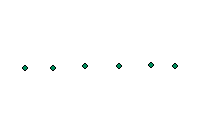

In [68]:
object_point_srvc = gis.content.search("DC_TrafficCameras_ConstitutionAve", item_type="feature service")[0]
object_point_srvc

In [69]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,F__OBJECTID,OBJECTID,activity_timestamp,attribute_0,content,createdAt,description,latitude,longitude,name,...,rt_bus_count,rt_car_count,rt_motorcycle_count,rt_object_count,rt_pedestrian_count,rt_truck_count,rt_vehicle_count,status,updatedAt,SHAPE
0,1,1,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450964690,None,38.892306,-77.028276,12th St @ Constitution Ave,...,0,7,0,7,0,0,7,"{'isDisabled': False, 'hasQualityWarning': False}",1473443714903,"{'x': -8574748, 'y': 4706257}"
1,2,2,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450997585,None,38.892269,-77.024097,9th St @ Constitution Ave,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473443731949,"{'x': -8574283, 'y': 4706252}"
2,3,3,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410451320851,None,38.892212,-77.033831,Constitution Ave @ 15th St,...,0,2,0,2,0,0,2,"{'isDisabled': False, 'hasQualityWarning': False}",1473443971638,"{'x': -8575367, 'y': 4706244}"
3,4,4,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454639501,None,38.892221,-77.039654,Constitution Ave @ 17th St,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473444480156,"{'x': -8576015, 'y': 4706245}"
4,5,5,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454655458,None,38.891985,-77.049949,Constitution Ave @ 23rd St,...,0,6,0,6,0,0,6,"{'isDisabled': False, 'hasQualityWarning': False}",1473444489566,"{'x': -8577161, 'y': 4706211}"


In [70]:
constitutionave_names_list = obj_df.name.tolist()
constitutionave_names_list

['12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St']

In [71]:
ddot_constitutionave_df = ddot_df[ddot_df.name.isin(constitutionave_names_list)]
ddot_constitutionave_df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt,latitude,longitude
428,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450964690,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",12th St @ Constitution Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200111,"{'isDisabled': False, 'hasQualityWarning': False}",1473443714903,38.892306,-77.028276
429,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450997585,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",9th St @ Constitution Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200112,"{'isDisabled': False, 'hasQualityWarning': False}",1473443731949,38.892269,-77.024097
442,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410451320851,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 15th St,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200126,"{'isDisabled': False, 'hasQualityWarning': False}",1473443971638,38.892212,-77.033831
453,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454639501,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 17th St,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200137,"{'isDisabled': False, 'hasQualityWarning': False}",1473444480156,38.892221,-77.039654
454,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454655458,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 23rd St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200138,"{'isDisabled': False, 'hasQualityWarning': False}",1473444489566,38.891985,-77.049949
461,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454792089,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 20th St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200145,"{'isDisabled': False, 'hasQualityWarning': False}",1473444595498,38.891975,-77.045043


In [72]:
str(ddot_constitutionave_df.shape[0])

'6'

https://esrifederal.maps.arcgis.com/home/webmap/viewer.html?webmap=e081b389ac8d4bdb817c34dbe78a5fc4

In [ ]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(10):
            print()
            
            for ix, row in enumerate(ddot_constitutionave_df.iterrows()):
                print("Processing camera {0} of {1}...".format(str(ix+1), str(ddot_constitutionave_df.shape[0])))

                # Retrieve camera information
                camera_jpeg_url = ddot_constitutionave_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_constitutionave_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_constitutionave_df.iloc[ix]['location']['longitude']
                camera_name = ddot_constitutionave_df.iloc[ix]['name']
                camera_id = ddot_constitutionave_df.iloc[ix]['publicId']
                
                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count
                
                # Retrieve the feature from the feature layer to update
                obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""", return_geometry=False)  
                all_features = obj_fset.features
                original_feature = all_features[0]
                feature_to_be_updated = deepcopy(original_feature)
                
                features_for_update = []
                feature_to_be_updated.attributes['rt_object_count'] = total_count
                feature_to_be_updated.attributes['rt_vehicle_count'] = vehicle_count
                feature_to_be_updated.attributes['rt_car_count'] = car_count
                feature_to_be_updated.attributes['rt_bus_count'] = bus_count
                feature_to_be_updated.attributes['rt_truck_count'] = truck_count
                feature_to_be_updated.attributes['rt_motorcycle_count'] = motorcycle_count
                feature_to_be_updated.attributes['rt_pedestrian_count'] = people_count
                feature_to_be_updated.attributes['rt_bicycle_count'] = bicycle_count

    #             feature_to_be_updated.attributes['rt_car_count'] = car_count
                features_for_update.append(feature_to_be_updated)
                object_point_lyr.edit_features(updates=features_for_update)    
            
                # Perform attachment of detected image
                scipy.misc.imsave('detected_objs.jpg', image_np)
#                 scipy.misc.imsave('ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))), image_np)
                obj_id = feature_to_be_updated.attributes['F__OBJECTID']
                object_point_lyr.attachments.add(obj_id, 'detected_objs.jpg')
#                 object_point_lyr.attachments.add(obj_id, 'ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))))

## Option 5: Trend-setter

<Item title:"DC_TrafficCameras_HIST_ConstAve" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
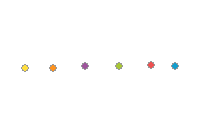

In [77]:
object_point_srvc = gis.content.search("DC_TrafficCameras_HIST_ConstAve", item_type="feature service")[0]
object_point_srvc

In [78]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,F__OBJECTID,OBJECTID,attribute_0,content,createdAt,description,latitude,longitude,name,observation_time,...,recording_time,rt_bicycle_count,rt_bus_count,rt_car_count,rt_motorcycle_count,rt_object_count,rt_pedestrian_count,rt_truck_count,rt_vehicle_count,SHAPE
0,1,1,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450964690,None,38.892306,-77.028276,12th St @ Constitution Ave,NaN,...,None,0,0,0,0,0,0,0,0,"{'x': -8574748, 'y': 4706257}"
1,2,2,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450997585,None,38.892269,-77.024097,9th St @ Constitution Ave,NaN,...,None,0,0,0,0,0,0,0,0,"{'x': -8574283, 'y': 4706252}"
2,3,3,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410451320851,None,38.892212,-77.033831,Constitution Ave @ 15th St,NaN,...,None,0,0,0,0,0,0,0,0,"{'x': -8575367, 'y': 4706244}"
3,4,4,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454639501,None,38.892221,-77.039654,Constitution Ave @ 17th St,NaN,...,None,0,0,0,0,0,0,0,0,"{'x': -8576015, 'y': 4706245}"
4,5,5,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454655458,None,38.891985,-77.049949,Constitution Ave @ 23rd St,NaN,...,None,0,0,0,0,0,0,0,0,"{'x': -8577161, 'y': 4706211}"


In [79]:
constitutionave_names_list = obj_df.name.tolist()
constitutionave_names_list

['12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St',
 '12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St',
 '12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St',
 '12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St',
 '12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution Ave @ 15th St',
 'Constitution Ave @ 17th St',
 'Constitution Ave @ 23rd St',
 'Constitution Ave @ 20th St',
 '12th St @ Constitution Ave',
 '9th St @ Constitution Ave',
 'Constitution

In [80]:
ddot_constitutionave_df = ddot_df[ddot_df.name.isin(constitutionave_names_list)]
ddot_constitutionave_df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt,latitude,longitude
428,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450964690,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",12th St @ Constitution Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200111,"{'isDisabled': False, 'hasQualityWarning': False}",1473443714903,38.892306,-77.028276
429,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410450997585,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",9th St @ Constitution Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200112,"{'isDisabled': False, 'hasQualityWarning': False}",1473443731949,38.892269,-77.024097
442,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410451320851,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 15th St,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200126,"{'isDisabled': False, 'hasQualityWarning': False}",1473443971638,38.892212,-77.033831
453,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454639501,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 17th St,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200137,"{'isDisabled': False, 'hasQualityWarning': False}",1473444480156,38.892221,-77.039654
454,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454655458,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 23rd St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200138,"{'isDisabled': False, 'hasQualityWarning': False}",1473444489566,38.891985,-77.049949
461,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410454792089,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Constitution Ave @ 20th St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200145,"{'isDisabled': False, 'hasQualityWarning': False}",1473444595498,38.891975,-77.045043


https://esrifederal.maps.arcgis.com/home/webmap/viewer.html?webmap=b99df66a66d64538995aecc98547dc40

In [ ]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(300):
            print("Iteration: {0} of {1}".format(str(iteration), str(300)))
            
            for ix, row in enumerate(ddot_constitutionave_df.iterrows()):
#                 print("Processing observation for camera {0} of {1}...".format(str(ix+1), str(ddot_constitutionave_df.shape[0])))

                # Retrieve camera information
                camera_jpeg_url = ddot_constitutionave_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_constitutionave_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_constitutionave_df.iloc[ix]['location']['longitude']
                camera_name = ddot_constitutionave_df.iloc[ix]['name']
                camera_id = ddot_constitutionave_df.iloc[ix]['publicId']
                
                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count
                
                # Retrieve the feature from the feature layer to update
                obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""")  
                all_features = obj_fset.features
                original_feature = all_features[0]
#                 feature_to_be_updated = deepcopy(original_feature)
                
                features_to_be_added = []
#                 template_feature = deepcopy(features_for_update[0])
                new_feature = deepcopy(original_feature)
                
#                 new_feature.attributes['name'] = camera_name
#                 new_feature.attributes['latitude'] = camera_lat
#                 new_feature.attributes['longitude'] = camera_lon
                new_feature.attributes['rt_object_count'] = total_count
                new_feature.attributes['rt_vehicle_count'] = vehicle_count
                new_feature.attributes['rt_car_count'] = car_count
                new_feature.attributes['rt_bus_count'] = bus_count
                new_feature.attributes['rt_truck_count'] = truck_count
                new_feature.attributes['rt_motorcycle_count'] = motorcycle_count
                new_feature.attributes['rt_pedestrian_count'] = people_count
                new_feature.attributes['rt_bicycle_count'] = bicycle_count
                new_feature.attributes['recording_id'] = "Cam{0}_{1}".format(str(ix),
                                                                             str(datetime.now().strftime("%m%d%y_%H%M%S")))
                new_feature.attributes['observation_time'] = datetime.now().strftime("%m/%d/%y %H:%M:%S")
                
                #add this to the list of features to be updated
                features_to_be_added.append(new_feature)
                
                object_point_lyr.edit_features(adds = features_to_be_added) 
            
#                 # Perform attachment of detected image
#                 scipy.misc.imsave('detected_objs.jpg', image_np)
# #                 scipy.misc.imsave('ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))), image_np)
#                 obj_id = feature_to_be_updated.attributes['F__OBJECTID']
#                 object_point_lyr.attachments.add(obj_id, 'detected_objs.jpg')
# #                 object_point_lyr.attachments.add(obj_id, 'ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))))

With auto-refresh of source JSON

In [88]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for refresh_iteration in range(1):
            print("Refresh iteration {0}...".format(str(refresh_iteration)))
            
            # TrafficLand API source JSON
            source_json = r"http://api.trafficland.com/v1.5/json/video_feeds?system=ddot&key=1594c8892d7fbd18181a8a6a44958b28"
            df = pd.read_json(source_json)
            ddot_df = df.loc[df.provider == 'DDOT']
            ddot_constitutionave_df = ddot_df[ddot_df.name.isin(constitutionave_names_list)]
            
            for iteration in range(100):
                print("Iteration: {0} of {1}".format(str(iteration), str(100)))

                for ix, row in enumerate(ddot_constitutionave_df.iterrows()):
    #                 print("Processing observation for camera {0} of {1}...".format(str(ix+1), str(ddot_constitutionave_df.shape[0])))

                    # Retrieve camera information
                    camera_jpeg_url = ddot_constitutionave_df.iloc[ix]['content']['hugeJpeg']
#                     camera_lat = ddot_constitutionave_df.iloc[ix]['location']['latitude']
#                     camera_lon = ddot_constitutionave_df.iloc[ix]['location']['longitude']
                    camera_name = ddot_constitutionave_df.iloc[ix]['name']
                    camera_id = ddot_constitutionave_df.iloc[ix]['publicId']

                    # Retrieve the camera image
                    camera_response = requests.get(camera_jpeg_url)

                    image = Image.open(BytesIO(camera_response.content))
                    image_np = load_image_into_numpy_array(image)
                    image_np_expanded = np.expand_dims(image_np, axis=0)

                    (boxes, scores, classes, num) = sess.run(
                          [detection_boxes, detection_scores, detection_classes, num_detections],
                          feed_dict={image_tensor: image_np_expanded})

                    vis_util.visualize_boxes_and_labels_on_image_array(
                          image_np,
                          np.squeeze(boxes),
                          np.squeeze(classes).astype(np.int32),
                          np.squeeze(scores),
                          category_index,
                          use_normalized_coordinates=True,
                          line_thickness=8)

                    car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                    vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                    total_count = vehicle_count + bicycle_count + people_count

                    # Retrieve the feature from the feature layer to update
                    obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""")  
                    all_features = obj_fset.features
                    original_feature = all_features[0]
    #                 feature_to_be_updated = deepcopy(original_feature)

                    features_to_be_added = []
    #                 template_feature = deepcopy(features_for_update[0])
                    new_feature = deepcopy(original_feature)

    #                 new_feature.attributes['name'] = camera_name
    #                 new_feature.attributes['latitude'] = camera_lat
    #                 new_feature.attributes['longitude'] = camera_lon
                    new_feature.attributes['rt_object_count'] = total_count
                    new_feature.attributes['rt_vehicle_count'] = vehicle_count
                    new_feature.attributes['rt_car_count'] = car_count
                    new_feature.attributes['rt_bus_count'] = bus_count
                    new_feature.attributes['rt_truck_count'] = truck_count
                    new_feature.attributes['rt_motorcycle_count'] = motorcycle_count
                    new_feature.attributes['rt_pedestrian_count'] = people_count
                    new_feature.attributes['rt_bicycle_count'] = bicycle_count
                    new_feature.attributes['recording_id'] = "Cam{0}_{1}".format(str(ix),
                                                                                 str(datetime.now().strftime("%m%d%y_%H%M%S")))
                    new_feature.attributes['observation_time'] = datetime.now().strftime("%m/%d/%y %H:%M:%S")

                    #add this to the list of features to be updated
                    features_to_be_added.append(new_feature)

                    object_point_lyr.edit_features(adds = features_to_be_added) 

    #                 # Perform attachment of detected image
    #                 scipy.misc.imsave('detected_objs.jpg', image_np)
    # #                 scipy.misc.imsave('ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))), image_np)
    #                 obj_id = feature_to_be_updated.attributes['F__OBJECTID']
    #                 object_point_lyr.attachments.add(obj_id, 'detected_objs.jpg')
    # #                 object_point_lyr.attachments.add(obj_id, 'ML_{0}.jpg'.format(str(datetime.now().strftime("%m%d%y_%H%M%S"))))

Refresh iteration 0...
Iteration: 0 of 100
Iteration: 1 of 100
Iteration: 2 of 100
Iteration: 3 of 100
Iteration: 4 of 100
Iteration: 5 of 100
Iteration: 6 of 100
Iteration: 7 of 100
Iteration: 8 of 100
Iteration: 9 of 100
Iteration: 10 of 100
Iteration: 11 of 100
Iteration: 12 of 100
Iteration: 13 of 100
Iteration: 14 of 100
Iteration: 15 of 100
Iteration: 16 of 100
Iteration: 17 of 100
Iteration: 18 of 100
Iteration: 19 of 100
Iteration: 20 of 100
Iteration: 21 of 100
Iteration: 22 of 100
Iteration: 23 of 100
Iteration: 24 of 100
Iteration: 25 of 100
Iteration: 26 of 100
Iteration: 27 of 100
Iteration: 28 of 100
Iteration: 29 of 100
Iteration: 30 of 100
Iteration: 31 of 100
Iteration: 32 of 100
Iteration: 33 of 100
Iteration: 34 of 100
Iteration: 35 of 100
Iteration: 36 of 100
Iteration: 37 of 100
Iteration: 38 of 100
Iteration: 39 of 100
Iteration: 40 of 100
Iteration: 41 of 100
Iteration: 42 of 100
Iteration: 43 of 100
Iteration: 44 of 100
Iteration: 45 of 100
Iteration: 46 of 100


ValueError: cannot reshape array of size 337920 into shape (480,704,3)

## General Util 01: Clean up attachments in DC FS

<Item title:"DDOT Traffic Cameras" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
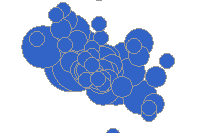

In [83]:
object_point_srvc = gis.content.search("DDOT Traffic Cameras", item_type="feature service")[0]
object_point_srvc

In [84]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,F__OBJECTID,activity_timestamp,attribute_0,content,createdAt,description,latitude,longitude,name,orientation,...,rt_bus_count,rt_car_count,rt_motorcycle_count,rt_object_count,rt_pedestrian_count,rt_truck_count,rt_vehicle_count,status,updatedAt,SHAPE
0,1,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420732661508,None,38.902599,-77.039233,K St @ 17th St & Conneticut Ave,WEST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': True}",1473442821241,"{'x': -8575968, 'y': 4707729}"
1,2,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381553029,None,38.936701,-77.024232,New Hampshire Ave @ Georgia Ave,SOUTH,...,0,3,0,3,0,0,3,"{'isDisabled': False, 'hasQualityWarning': False}",1473442837977,"{'x': -8574298, 'y': 4712609}"
2,3,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381584896,None,38.905143,-77.068561,M St @ Francis Scott Key Brdg,WEST,...,0,4,0,4,0,0,4,"{'isDisabled': False, 'hasQualityWarning': False}",1473442847933,"{'x': -8579233, 'y': 4708093}"
3,4,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420749104062,None,38.876366,-77.009061,M St @ S Capitol St,EAST,...,0,4,0,4,0,0,4,"{'isDisabled': False, 'hasQualityWarning': False}",1473442869524,"{'x': -8572609, 'y': 4703978}"
4,5,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381400497,None,38.909042,-77.004583,Florida Ave @ New York Ave,WEST,...,0,3,0,3,0,0,3,"{'isDisabled': False, 'hasQualityWarning': False}",1473442883854,"{'x': -8572111, 'y': 4708651}"


In [85]:
all_features = obj_fset.features
all_features

[{"geometry": {"x": -8575968, "y": 4707729}, "attributes": {"F__OBJECTID": 1, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200001/half?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200001/full?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200001/huge?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000'}", "createdAt": 1420732661508, "description": null, "name": "K St @ 17th St & Conneticut Ave", "orientation": "WEST", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200001, "status": "{'isDisabled': False, 'hasQualityWarning': True}", "updatedAt": 1473442821241, "latitude": 38.902599, "longitude": -77.039233, "rt_objec

In [86]:
original_feature = all_features[1]
feature_to_be_updated = deepcopy(original_feature)
feature_to_be_updated

{"geometry": {"x": -8574298, "y": 4712609}, "attributes": {"F__OBJECTID": 2, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200002/half?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200002/full?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'}", "createdAt": 1410381553029, "description": null, "name": "New Hampshire Ave @ Georgia Ave", "orientation": "SOUTH", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200002, "status": "{'isDisabled': False, 'hasQualityWarning': False}", "updatedAt": 1473442837977, "latitude": 38.936701, "longitude": -77.024232, "rt_obje

In [87]:
obj_fset = object_point_lyr.query(where="""name = 'New Hampshire Ave @ Georgia Ave'""", return_geometry=False) 
# obj_fset = object_point_lyr.query(where="""1=1""", return_geometry=False) 
obj_fset.features

[{"attributes": {"F__OBJECTID": 2, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200002/half?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200002/full?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'}", "createdAt": 1410381553029, "description": null, "name": "New Hampshire Ave @ Georgia Ave", "orientation": "SOUTH", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200002, "status": "{'isDisabled': False, 'hasQualityWarning': False}", "updatedAt": 1473442837977, "latitude": 38.936701, "longitude": -77.024232, "rt_object_count": 3, "rt_vehicle_count": 3, "rt_c

In [ ]:
for iteration in range(1):
    
    features_for_update = []
            
    for ix in range(1,100):
        print("Removing attachments for camera {0} of 100...".format(str(ix)))

        # Retrieve camera information
        camera_name = ddot_df.iloc[ix]['name']

        # Retrieve the feature from the feature layer to update
        obj_fset = object_point_lyr.query(where="""name = '"""+camera_name+"""'""", return_geometry=False)  
        all_features = obj_fset.features
        original_feature = all_features[0]
        feature_to_be_updated = deepcopy(original_feature)

        feature_to_be_updated.attributes['rt_object_count'] = 0
        feature_to_be_updated.attributes['rt_vehicle_count'] = 0
        feature_to_be_updated.attributes['rt_car_count'] = 0
        feature_to_be_updated.attributes['rt_bus_count'] = 0
        feature_to_be_updated.attributes['rt_truck_count'] = 0
        feature_to_be_updated.attributes['rt_motorcycle_count'] = 0
        feature_to_be_updated.attributes['rt_pedestrian_count'] = 0
        feature_to_be_updated.attributes['rt_bicycle_count'] = 0

        features_for_update.append(feature_to_be_updated)
    
    object_point_lyr.edit_features(updates=features_for_update)
    
                # Perform attachment of detected image
                scipy.misc.imsave('detected_objs.jpg', image_np)
                obj_id = feature_to_be_updated.attributes['F__OBJECTID']
                object_point_lyr.attachments.add(obj_id, 'detected_objs.jpg')